# pairplot

При рассмотрении примеров работы библиотеки seaborn, нам также понадобятся библиотеки matplotlib, pandas и numpy.



In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [2]:
%config InlineBackend.figure_format = 'svg'

Данный код позволяет отображать графики в формате SVG (Scalable Vector Graphics), то есть в формате векторной графики. SVG основан на векторах, и это означает, что изображения состоят из линий и форм, а не пикселей. Это позволяет масштабировать изображения без потери качества.

Функция `sns.pairplot()` используется для создания матрицы диаграмм рассеяния. Она автоматически создает сетку графиков для визуализации взаимосвязей между всеми парами переменных в наборе данных и часто используется для предварительного анализа данных.

Основные параметры
- `data`: DataFrame, содержащий данные для визуализации;
- `hue`: позволяет применять цветовую дифференциацию для различных категорий;
- `hue_order`: порядок отображения категорий для переменной hue;
- `palette`: палитра цветов для категорий;
- `vars`: список переменных для включения в графики. Если не указано, будут использованы все числовые переменные;
- `x_vars`: список переменных для отображения на оси X;
- `y_vars`: список переменных для отображения на оси Y;
- `kind`: тип графика для нижней и верхней треугольной части матрицы. Может быть 'scatter', 'kde', 'hist' или 'reg'. По умолчанию 'scatter';
- `diag_kind`: тип графика для диагональных элементов. Может быть auto, hist, или kde;
- `markers`: маркеры для категорий;
- `height`: высота каждого подграфика в дюймах (по умолчанию 2.5);
- `aspect`: соотношение ширины к высоте подграфика (по умолчанию 1);
- `corner`: если True, строит только нижнюю часть диагонали и графики по диагонали (по умолчанию False);
- `dropna`: если True, исключает пропущенные значения перед построением графиков (по умолчанию False);
- `plot_kws`: позволяет передавать дополнительные аргументы для настройки графиков, отображаемых на нижнем и верхнем треугольниках матрицы;
- `diag_kws`: позволяет передавать дополнительные аргументы для настройки диагональных графиков;
- `grid_kws`: позволяет передавать дополнительные аргументы для настройки всей сетки графиков.

Загрузим обучающий датасет для рассмотрения примеров:

In [3]:
tips = sns.load_dataset('tips')

tips.head()

,total_bill,tip,sex,smoker,day,time,size
0,16.99,1.01,Female,No,Sun,Dinner,2
1,10.34,1.66,Male,No,Sun,Dinner,3
2,21.01,3.50,Male,No,Sun,Dinner,3
3,23.68,3.31,Male,No,Sun,Dinner,2
4,24.59,3.61,Female,No,Sun,Dinner,4


In [4]:
tips.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 244 entries, 0 to 243
Data columns (total 7 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   total_bill  244 non-null    float64 
 1   tip         244 non-null    float64 
 2   sex         244 non-null    category
 3   smoker      244 non-null    category
 4   day         244 non-null    category
 5   time        244 non-null    category
 6   size        244 non-null    int64   
dtypes: category(4), float64(2), int64(1)
memory usage: 7.4 KB


Датафрейм содержит следующую информацию:
- **total_bill**: общая сумма счета;
- **tip**: сумма чаевых;
- **sex**: пол посетителя;
- **smoker**: курящий или нет;
- **day**: день недели;
- **time**: время посещения ресторана (обед или ужин);
- **size**: количество людей за столиком.

Построим график pairplot:

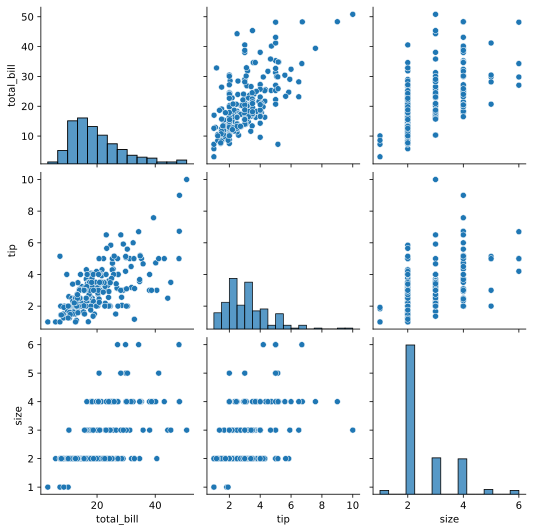

In [5]:
sns.pairplot(tips);

В итоге, отобразилась матрица парных графиков для всех числовых переменных в датафрейме `tips`. На диагонали матрицы создаются гистограммы для каждой числовой переменной, показывающие распределение значений этой переменной. В остальных ячейках матрицы создаются диаграммы рассеяния для всех пар числовых переменных, показывающие взаимосвязь между двумя переменными.

**Параметр kind**

По умолчанию в верхней и нижней треугольных частях матрицы построились графики scatterplot. Функция `sns.pairplot()` также позволяет создавать графики типа **kdeplot**, **histplot** и **regplot**. Продемонстрируем эти возможности на примерах.

`kind='kde'`:

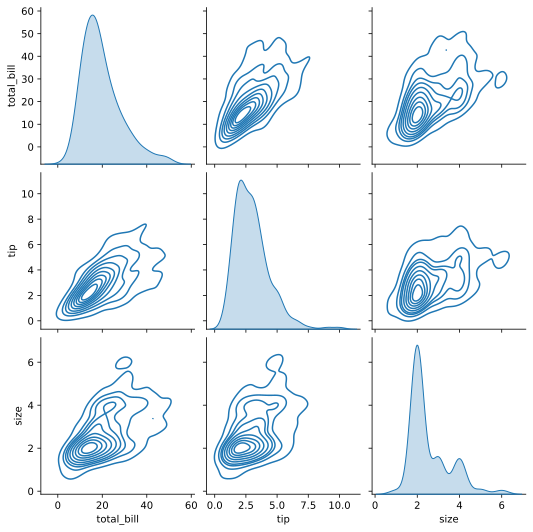

In [6]:
sns.pairplot(tips, 
             kind='kde');

`kind='hist'`:

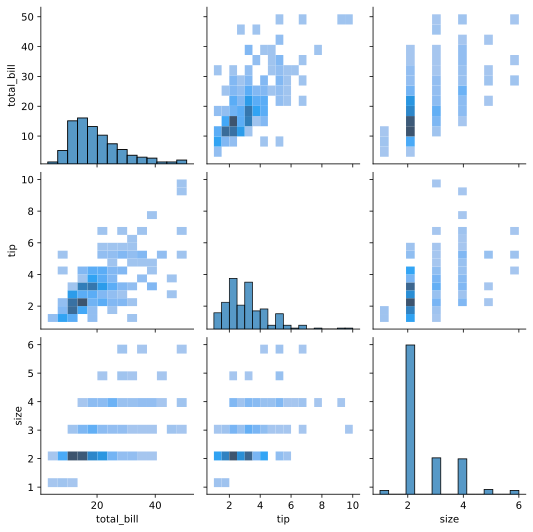

In [7]:
sns.pairplot(tips, 
             kind='hist');

`kind='reg'`:

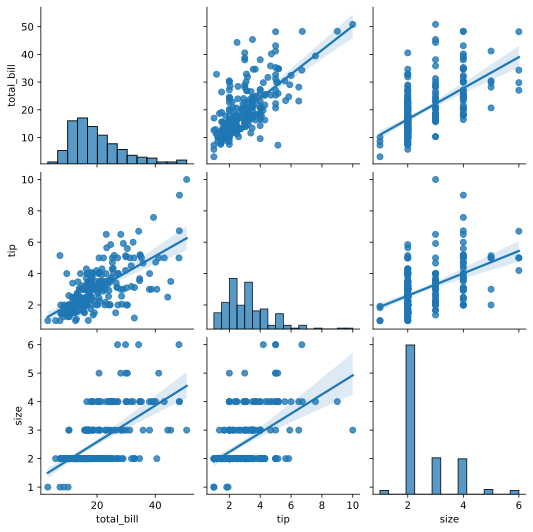

In [8]:
sns.pairplot(tips, 
             kind='reg');

**Параметр diag_kind**

Параметр `diag_kind` в функции `sns.pairplot()` определяет тип графика, который будет отображаться на диагональных подграфиках матрицы.

Возможные значения параметра **diag_kind**:
- `'auto'` (по умолчанию): Seaborn автоматически выбирает тип графика в зависимости от данных. Обычно это будет гистограмма.
- `'hist'`: Построение гистограмм для каждой переменной на диагональных подграфиках. Гистограмма показывает распределение значений переменной, разбивая их на интервалы (бины) и отображая количество значений в каждом интервале.
- `'kde'`: Построение графиков оценки плотности ядра для каждой переменной. Эти графики дают сглаженное представление распределения данных, показывая, где значения наиболее плотны.
- `None`: Если указать None, диагональные подграфики не будут построены. Вернее, они будут построены, но на них отобразится зависимость переменной от самой себя.

Например, построим график pairplot с диаграммами `kde` на диагонали:

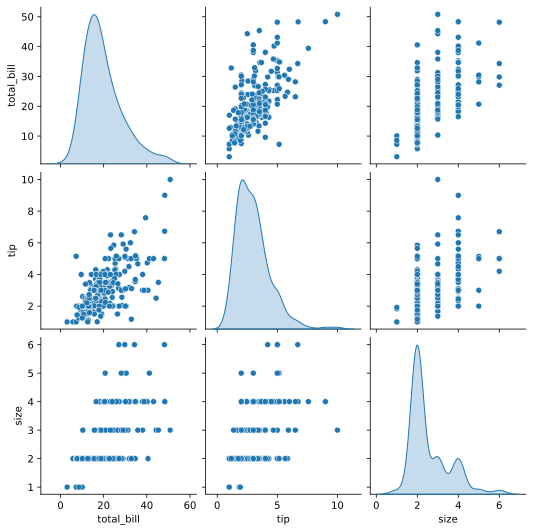

In [9]:
sns.pairplot(tips, 
             diag_kind='kde');

параметры `hue` и `hue_order`

Используем знакомый вам параметр `hue`, чтобы раскрасить точки в разные цвета в зависимости от времени посещения ресторана:

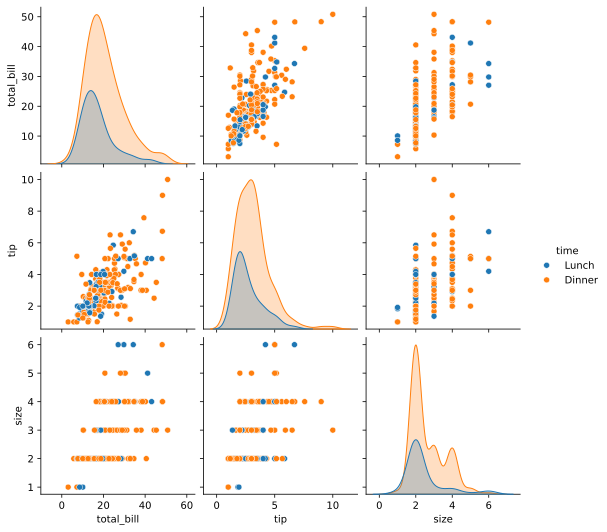

In [10]:
sns.pairplot(tips,
             hue='time');

Параметром `hue_order` поменяем местами цвета на графике:

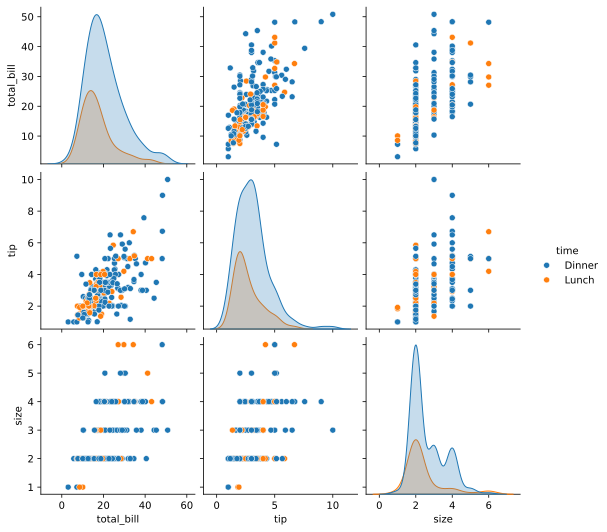

In [11]:
sns.pairplot(tips,
             hue='time',
             hue_order=['Dinner', 'Lunch']);

**Параметры vars, x_vars, y_vars**

В функции `sns.pairplot()` параметры `vars`, `x_vars` и `y_vars` позволяют вам выбрать, какие переменные из датафрейма будут использоваться для создания графиков. Эти параметры дают возможность более гибко контролировать, какие переменные отображаются в матрице парных графиков. Их применение особенно полезно в случаях, когда датафрейм содержит большое количество числовых столбцов.

Параметр `vars` позволяет указать список переменных, которые будут отображаться как на оси `X`, так и на оси `Y`.

Для примера создадим парные графики только для двух переменных:

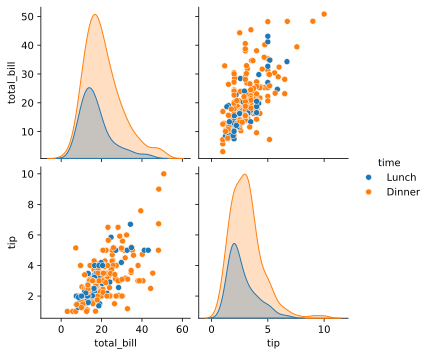

In [12]:
sns.pairplot(tips,
             hue='time',
             vars=['total_bill', 'tip']);

Параметры `x_vars` и `y_vars` позволяют отдельно указать переменные для осей `X` и `Y`, что позволяет создавать матрицы парных графиков с различными наборами переменных для каждой оси.

Например, по оси `Y` отложим только одну переменную:

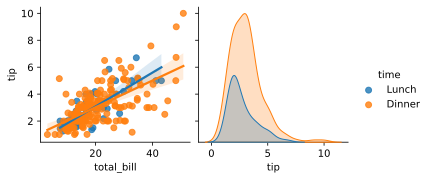

In [13]:
sns.pairplot(tips,
             kind='reg',
             hue='time',
             x_vars=['total_bill', 'tip'],
             y_vars=['tip']);

Параметром `height` увеличим график:

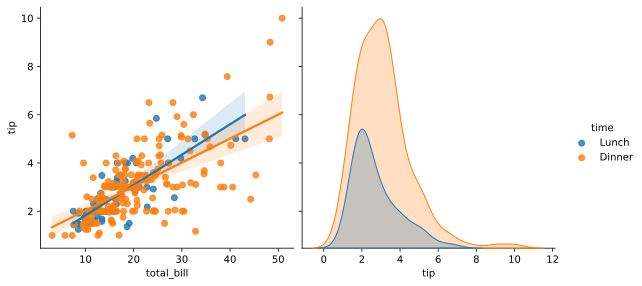

In [14]:
sns.pairplot(tips,
             kind='reg',
             hue='time',
             x_vars=['total_bill', 'tip'],
             y_vars=['tip'],
             height=4);

Параметром `markers` меняют типы точек на графиках. Для примера сделаем разные маркеры для каждой категории:

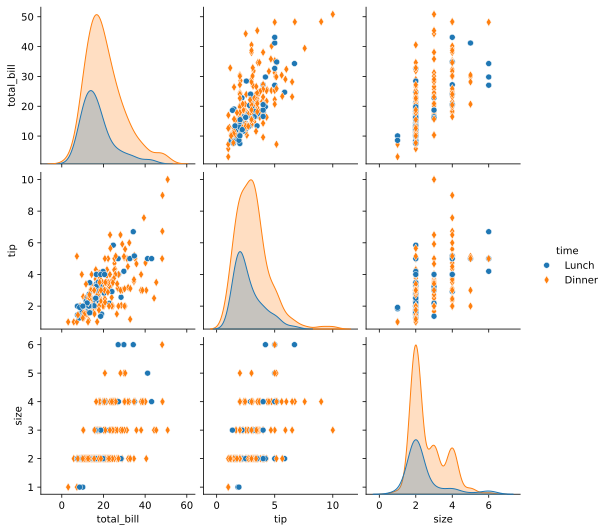

In [15]:
sns.pairplot(tips,
             hue='time',
             markers=['o', 'd']);

Изменение типов маркеров может быть особенно полезным, когда вы планируете распечать график в чёрно-белом варианте.

**Параметр diag_kws**

Параметр `diag_kws` позволяет передавать дополнительные параметры для настройки диагональных графиков; `diag_kws` принимает словарь, в котором ключи являются именами параметров, а значения - их значениями.

Параметры, которые можно передавать через `diag_kws`, зависят от типа диагонального графика (diag_kind), который используется: гистограмма ('hist') или оценка плотности ядра ('kde').

Некоторые параметры для гистограммы:
- `bins`: Количество бинов в гистограмме.
- `fill`: Если True, то будет применена заливка столбцов цветом.
- `color`: Цвет столбцов гистограммы.
- `alpha`: Прозрачность столбцов гистограммы.
- `edgecolor`: Цвет границ столбцов гистограммы.
- `cumulative`: Если True, то гистограмма будет кумулятивной.
- `linewidth`: Толщина линий границ столбцов.

Пример использования параметра `color`:

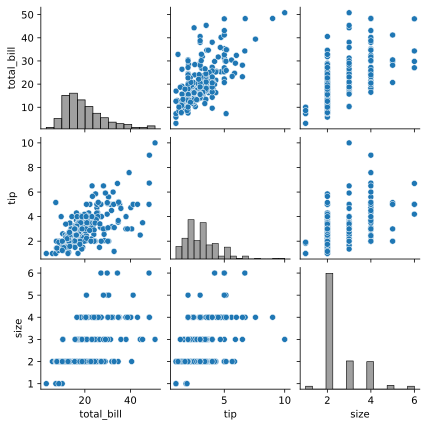

In [16]:
sns.pairplot(tips,
             height=2,
             diag_kws={'color': 'grey'});

Пример использования `bins`:

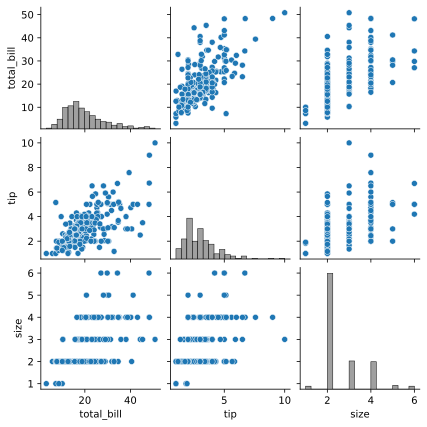

In [17]:
sns.pairplot(tips,
             height=2,
             diag_kws={'color': 'grey',
                       'bins': 20});

Использование параметра `edgecolor`:

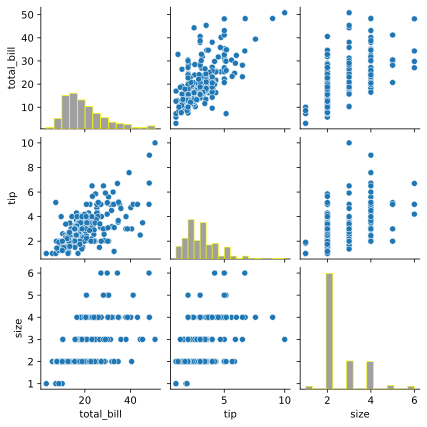

In [18]:
sns.pairplot(tips,
             height=2,
             diag_kws={'color': 'grey',
                       'edgecolor': 'yellow'});

Пример использования параметра `cumulative`:

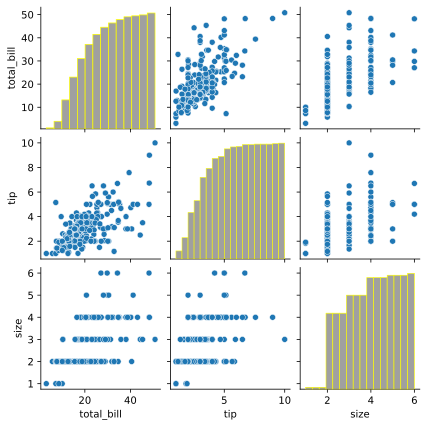

In [19]:
sns.pairplot(tips,
             height=2,
             diag_kws={'color': 'grey',
                       'edgecolor': 'yellow',
                       'cumulative': True});

Пример использования `linewidth`:

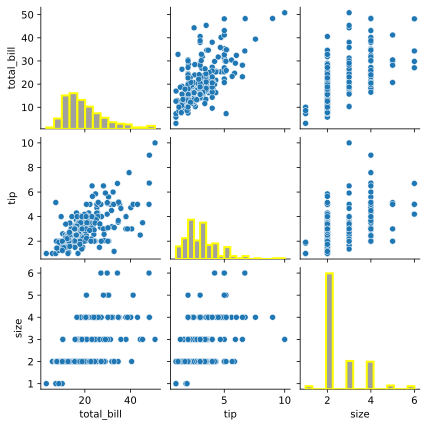

In [20]:
sns.pairplot(tips,
             height=2,
             diag_kws={'color': 'grey',
                       'edgecolor': 'yellow',
                       'linewidth': 2});

Отмена заливки столбцов гистограммы параметром `fill`:

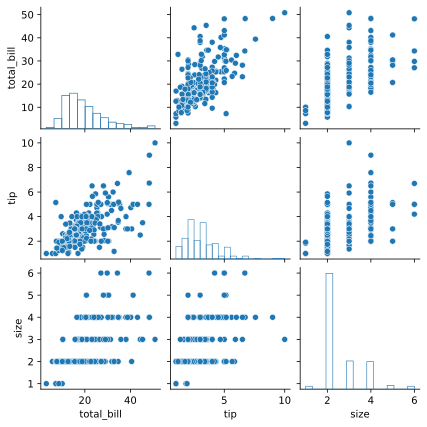

In [21]:
sns.pairplot(tips,
             height=2,
             diag_kws={'fill': False});

Некоторые параметры для `kde`:
- `fill`: Если True, то область под кривой будет залита цветом.
- `cut`: Длина расширения плотности за пределы данных (в единицах ширины полосы).
- `color`: Цвет кривой.
- `alpha`: Прозрачность кривой.
- `linewidth`: Толщина линии кривой.

Пример использования параметра `fill`:

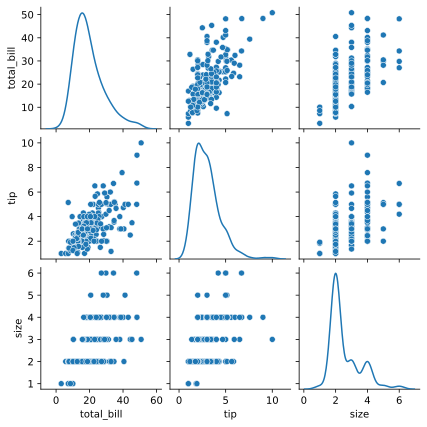

In [22]:
sns.pairplot(tips,
             height=2,
             diag_kind='kde',
             diag_kws={'fill': False});

Применим параметр `cut` со значением `0`:

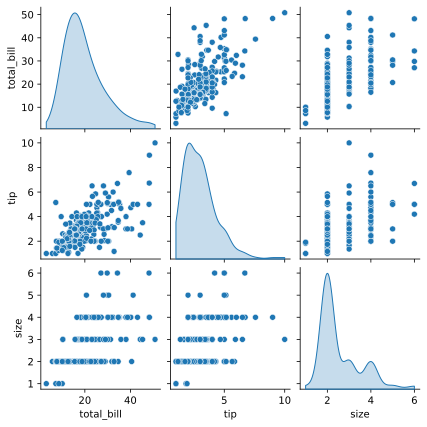

In [23]:
sns.pairplot(tips,
             height=2,
             diag_kind='kde',
             diag_kws={'cut': 0});

Пример использования `color`:

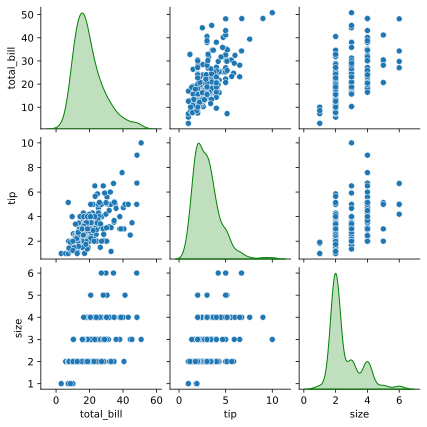

In [24]:
sns.pairplot(tips,
             height=2,
             diag_kind='kde',
             diag_kws={'color': 'green'});

Пример использования параметра `linewidth`:

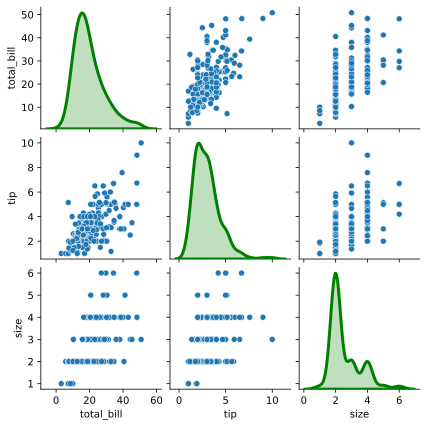

In [25]:
sns.pairplot(tips,
             height=2,
             diag_kind='kde',
             diag_kws={'color': 'green',
                       'linewidth': 3});

**Параметр plot_kws**

Параметр `plot_kws` фунции `sns.pairplot()` позволяет передавать дополнительные аргументы для настройки графиков, отображаемых на нижнем и верхнем треугольниках матрицы.

Некоторые параметры для `kind='scatter'`:
- `color`: Цвет точек.
- `marker`: Тип маркера.
- `alpha`: Прозрачность точек.
- `s`: Размер точек.
- `edgecolor`: Цвет границ точек.
- `linewidth`: Толщина линий границ точек.

Построим pairplot с параметрами по умолчанию:

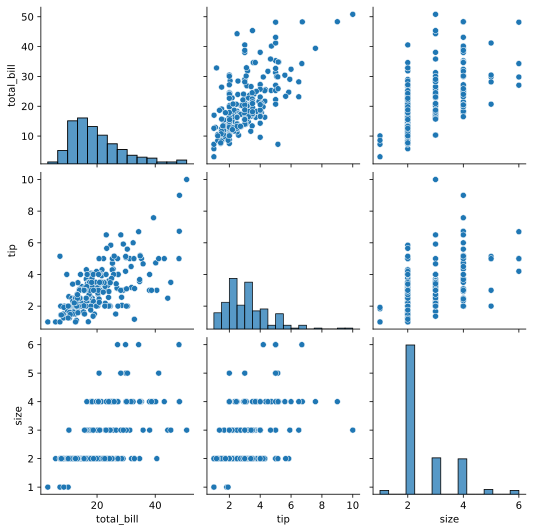

In [26]:
sns.pairplot(tips);

Применим параметр `color` для точек:

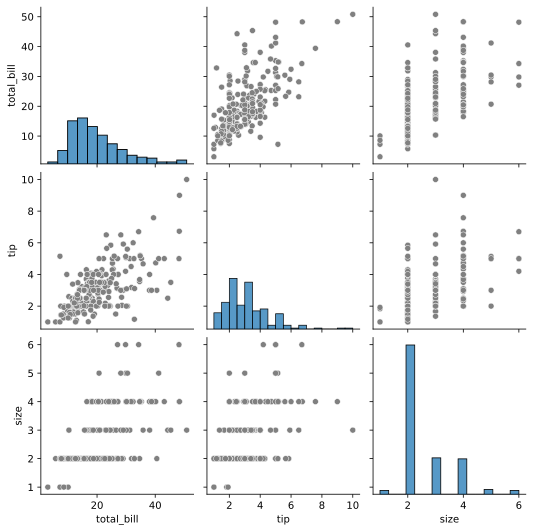

In [28]:
sns.pairplot(tips,
             plot_kws={'color': 'grey'});

Пример использования параметра `marker`:

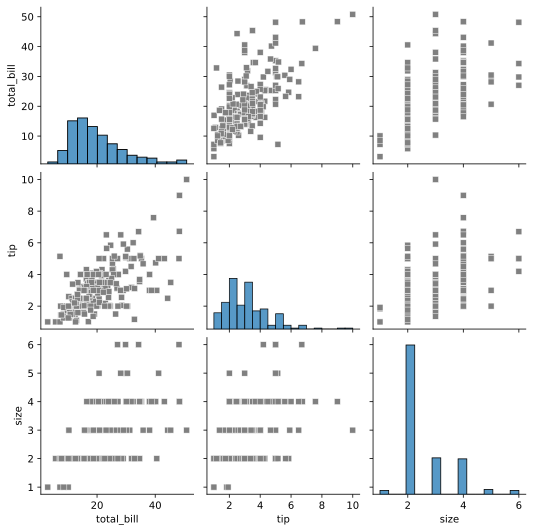

In [29]:
sns.pairplot(tips,
             plot_kws={'color': 'grey',
                       'marker': 's'});

С использованием параметра `s` уменьшим размер точек:

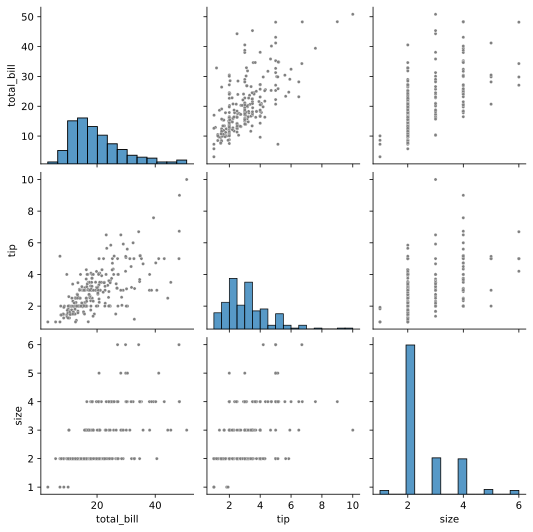

In [30]:
sns.pairplot(tips,
             plot_kws={'color': 'grey',
                       's': 10});

Пример использования параметра `edgecolor`:

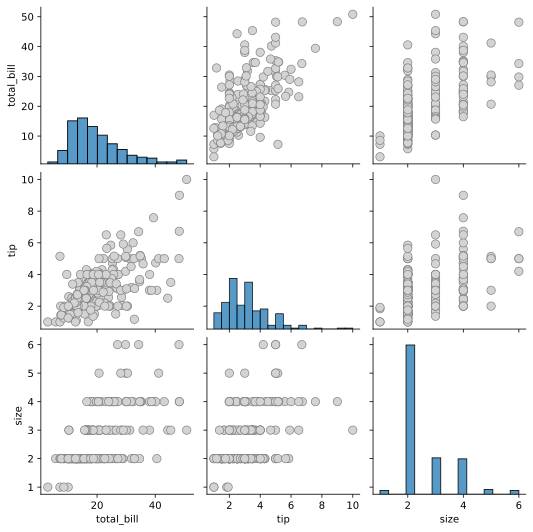

In [31]:
sns.pairplot(tips,
             plot_kws={'color': 'lightgrey',
                       's': 70,
                       'edgecolor': 'grey'});

Полупрозрачные точки на графиках:

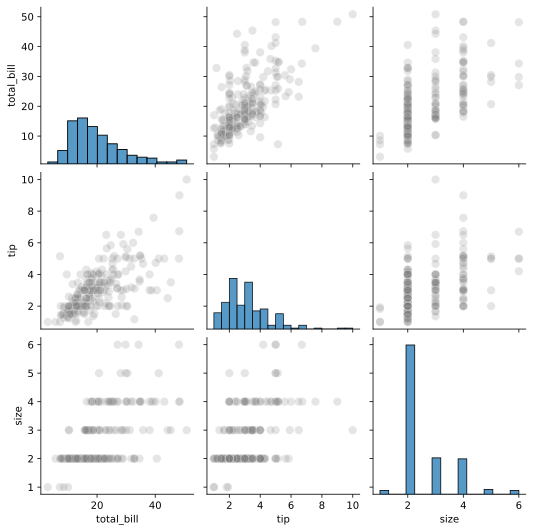

In [32]:
sns.pairplot(tips,
             plot_kws={'color': 'grey',
                       's': 70,
                       'alpha': 0.2});

Некоторые параметры `plot_kws` для `kind='reg'`:
- `ci`: Доверительный интервал для линии регрессии.
- `color`: Цвет точек, линии регрессии и доверительного интервала.
- `scatter_kws`: Словарь параметров для настройки точек scatterplot.
- `line_kws`: Словарь параметров для настройки регрессионной линии.
- `marker`: Тип маркера.
- `truncate`: Если True, обрезает регрессионную линию по границам данных.

Нарисуем регрессионный график pairplot с параметрами по умолчанию:

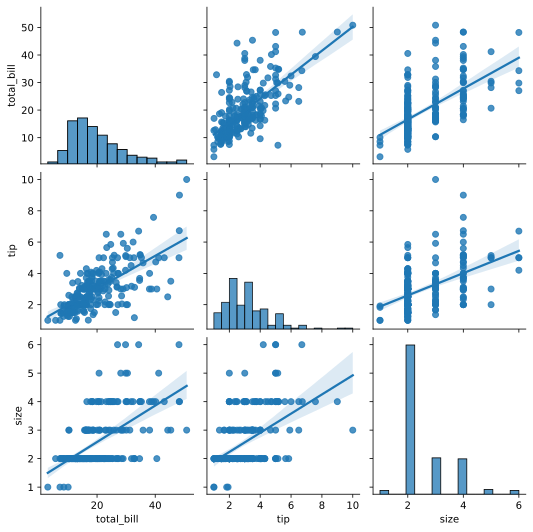

In [33]:
sns.pairplot(tips,
             kind='reg');

Параметром `'ci': None` уберём доверительные интервалы с подграфиков:

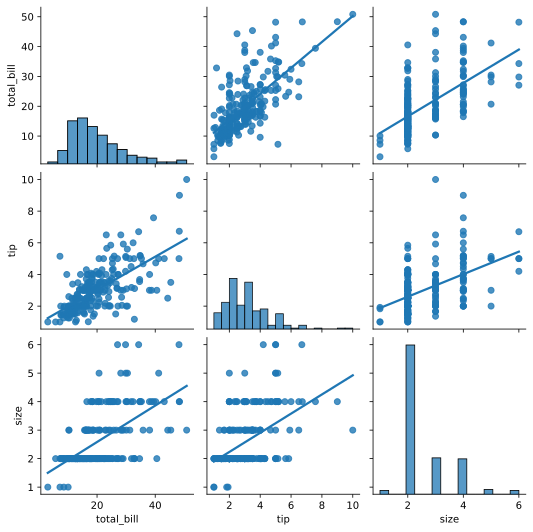

In [34]:
sns.pairplot(tips,
             kind='reg',
             plot_kws={'ci': None});

Параметром `color` перекрасим точки, линии регрессии и доверительные интервалы:

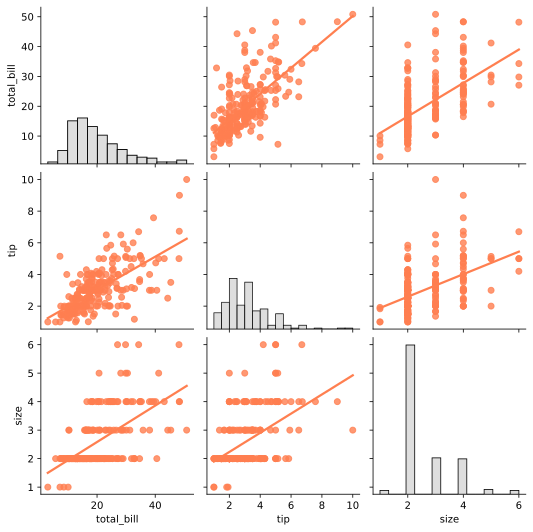

In [35]:
sns.pairplot(tips,
             kind='reg',
             diag_kws={'color': 'lightgrey'},
             plot_kws={'ci': None,
                       'color': 'Coral'});

Параметром `scatter_kws` с использованием подпараметра `color` изменим цвет точек:

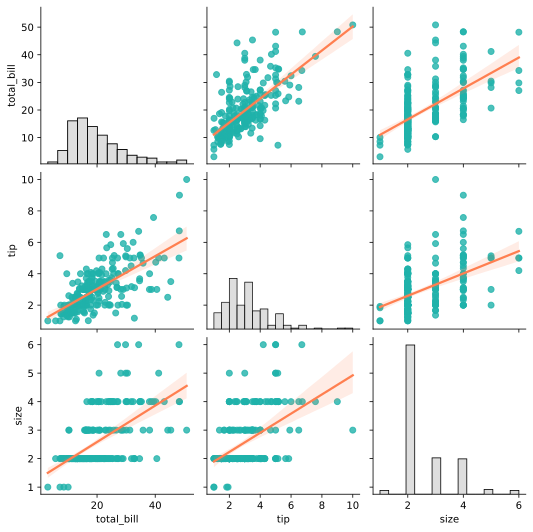

In [36]:
sns.pairplot(tips,
             kind='reg',
             diag_kws={'color': 'lightgrey'},
             plot_kws={'color': 'Coral',
                       'scatter_kws': {'color': 'LightSeaGreen'}});

Увеличим размер точек и придадим им прозрачности:

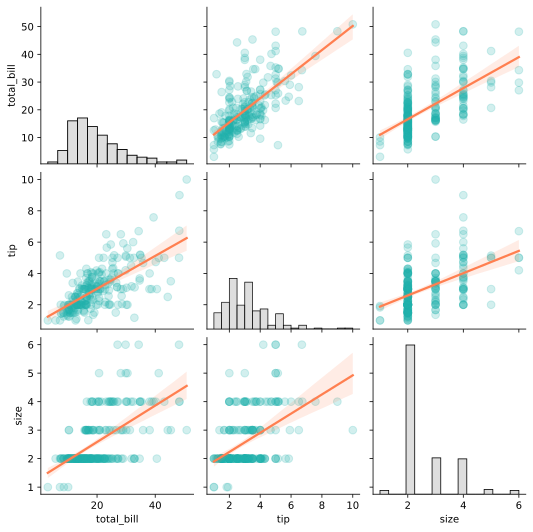

In [37]:
sns.pairplot(tips,
             kind='reg',
             diag_kws={'color': 'lightgrey'},
             plot_kws={'color': 'Coral',
                       'scatter_kws': {'color': 'LightSeaGreen',
                                       's': 60,
                                       'alpha': 0.2}});

И пример использования параметра `marker`:

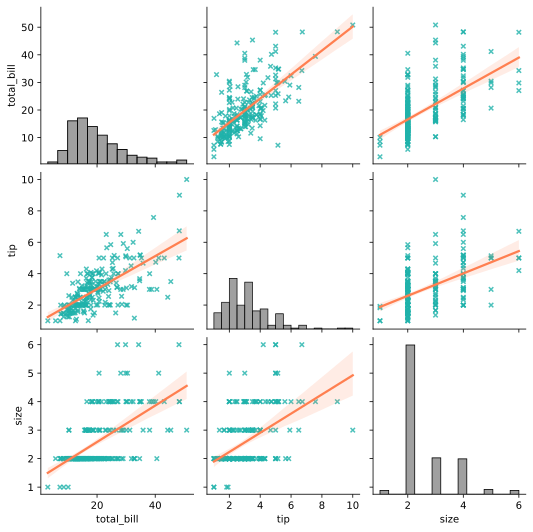

In [38]:
sns.pairplot(tips,
             kind='reg',
             diag_kws={'color': 'grey'},
             plot_kws={'color': 'Coral',
                       'scatter_kws': {'color': 'LightSeaGreen',
                                       's': 20},
                       'marker': 'x'});

**Параметр grid_kws**

Параметр `grid_kws` функции `sns.pairplot()` позволяет передавать дополнительные параметры для настройки сетки подграфиков.

Параметры `grid_kws`:
- `despine`: Удаление верхней и правой рамок у подграфиков.
- `layout_pad`: Отступы между подграфиками.
- `diag_sharey`: Если True, диагональные подграфики будут иметь общую ось Y.

Пример использования `'despine': False`:

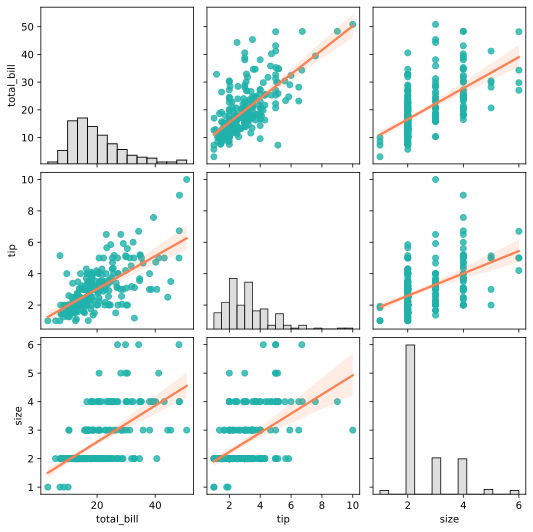

In [39]:
sns.pairplot(tips,
             kind='reg',
             diag_kws={'color': 'lightgrey'},
             plot_kws={'color': 'Coral',
                       'scatter_kws': {'color': 'LightSeaGreen'}},
             grid_kws={'despine': False});

Использование параметра `layout_pad`:

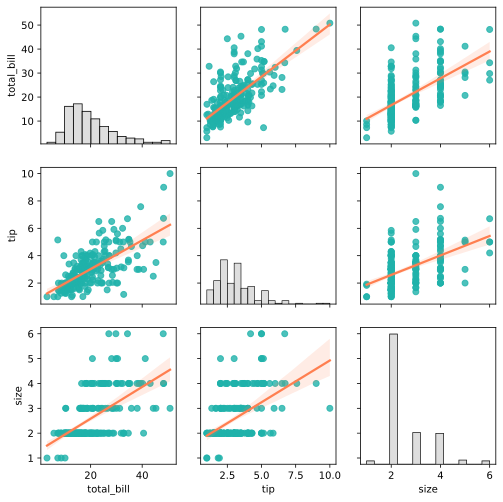

In [40]:
sns.pairplot(tips,
             kind='reg',
             diag_kws={'color': 'lightgrey'},
             plot_kws={'color': 'Coral',
                       'scatter_kws': {'color': 'LightSeaGreen'}},
             grid_kws={'despine': False,
                       'layout_pad': 2});

И пример использования `'diag_sharey': False`:

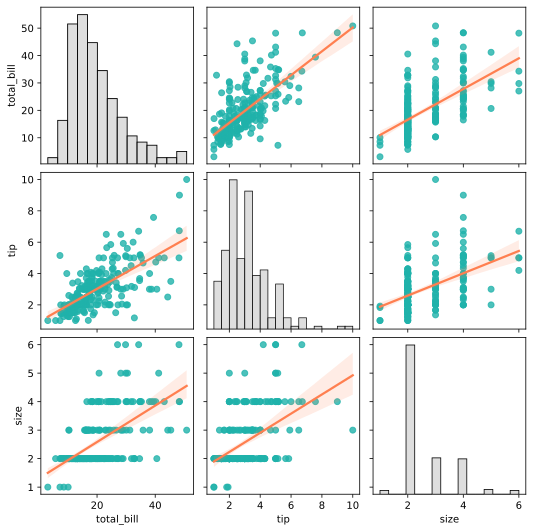

In [41]:
sns.pairplot(tips,
             kind='reg',
             diag_kws={'color': 'lightgrey'},
             plot_kws={'color': 'Coral',
                       'scatter_kws': {'color': 'LightSeaGreen'}},
             grid_kws={'despine': False,
                       'diag_sharey': False});

**Параметр corner**

Параметр `corner` функции `sns.pairplot()` используется для создания треугольной матрицы парных графиков, отображая только нижнюю часть диаграммы.

Например:

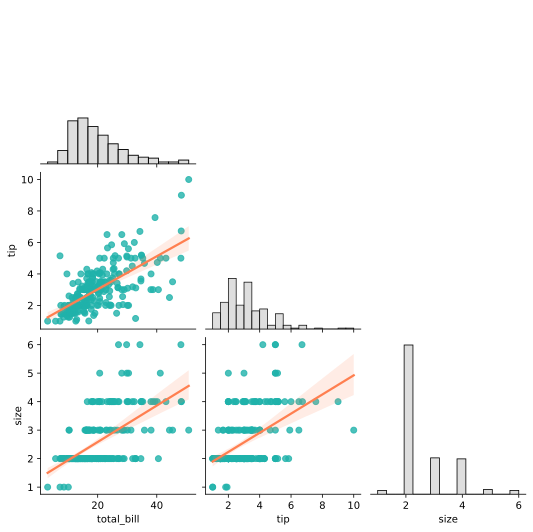

In [42]:
sns.pairplot(tips,
             kind='reg',
             diag_kws={'color': 'lightgrey'},
             plot_kws={'color': 'Coral',
                       'scatter_kws': {'color': 'LightSeaGreen'}},
             corner=True);

Функция `sns.pairplot()` предоставляет удобный способ быстро создать матрицу парных графиков с минимальными настройками. Внутри функция `sns.pairplot()` создает объект **PairGrid** и выполняет набор предопределенных операций для добавления графиков в сетку. То есть функция `sns.pairplot()` является высокоуровневой "оберткой" вокруг класса **PairGrid**.

Использование класса **PairGrid** может быть востребовано в тех случаях, когда необходимы индивидуальные настройки парных графиков, выходящие за рамки возможностей функции `sns.pairplot()`.

Основные параметры класса **PairGrid**:
- `data`: DataFrame, содержащий данные для визуализации.
- `hue`: Переменная, используемая для разделения данных по цветам. Полезно для отображения категориальных данных.
- `hue_kws`: Дополнительные параметры для категорий hue.
- `palette`: Цветовая палитра для переменной hue.
- `vars`: Список имен переменных для отображения. Если не указано, используются все переменные из data
- `x_vars` и `y_vars`: Списки переменных для отображения на осях X и Y, соответственно. Позволяют создавать асимметричные сетки.
- `height`: Высота каждой ячейки в дюймах.
- `aspect`: Соотношение сторон каждой ячейки (ширина к высоте).
- `corner`: Если True, создает треугольную матрицу парных графиков.
- `diag_sharey`: Если True, диагональные подграфики будут иметь общую ось Y.

Основные методы **PairGrid**:
- `map(func, **kwargs)`: Применяет функцию func ко всем ячейкам сетки.
- `map_upper(func, **kwargs)`: Применяет функцию func только к ячейкам в верхнем треугольнике сетки.
- `map_lower(func, **kwargs)`: Применяет функцию func только к ячейкам в нижнем треугольнике сетки.
- `map_diag(func, **kwargs)`: Применяет функцию func только к диагональным ячейкам сетки.
- `map_offdiag(func, **kwargs)`: Применяет функцию func к ячейкам сетки вне диагонали.
- `add_legend(**kwargs)`: Добавляет легенду к сетке. Полезно при использовании параметра hue для категориальных данных.
- `set_titles(template=None, row_template=None, col_template=None, **kwargs)`: Устанавливает заголовки для рядов и колонок сетки.
- `apply(func, *args, **kwargs)`: Позволяет применять произвольную функцию к каждой ячейке сетки.
- `fig`: Доступ к объекту Figure matplotlib, что позволяет делать дополнительные настройки фигуры.
- `savefig(filename, **kwargs)`: Сохраняет объект в файл.

Присвоим объект, созданный функцией `sns.pairplot()`, переменной `g`:

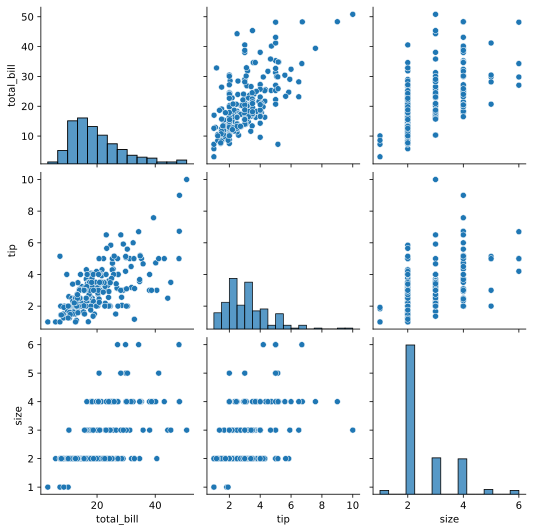

In [43]:
g = sns.pairplot(tips)

Посмотрим на тип переменной `g`:

In [44]:
print(type(g))

<class 'seaborn.axisgrid.PairGrid'>


Результат выполнения этого кода подтвердил, что переменная `g` является экземпляром класса **PairGrid**.

Теперь к этой переменной мы можем применять методы класса **PairGrid**. Например, давайте добавим на верхние подграфики контурные линии `kde`:

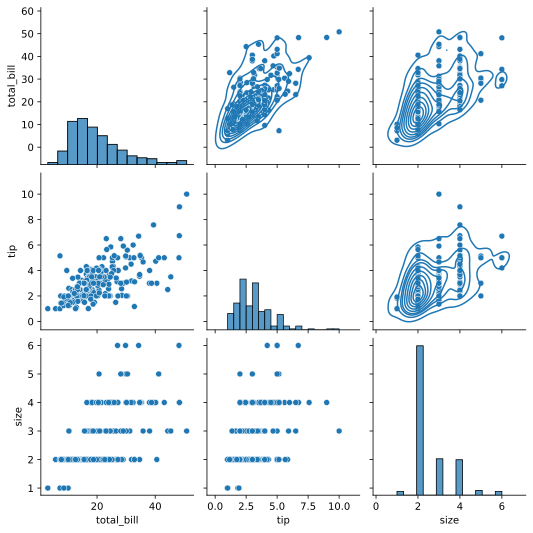

In [45]:
g = sns.pairplot(tips)
g.map_upper(sns.kdeplot);

Уменьшим количество контурных линий при помощи параметра `n_levels` и поменяем их цвет:

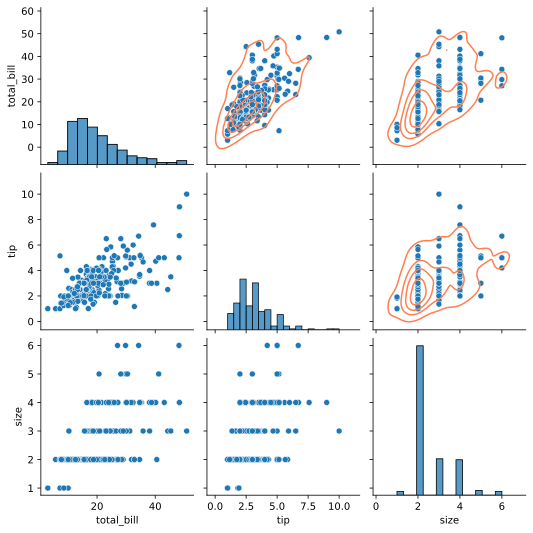

In [46]:
g = sns.pairplot(tips)
g.map_upper(sns.kdeplot,
            color='coral',
            n_levels=5);

Подобным образом вы можете добавлять необходимые вам элементы на график, построенный функцией `pairplot()`.

Теперь создадим объект класса **PairGrid** напрямую, без применения функции `sns.pairplot()`:

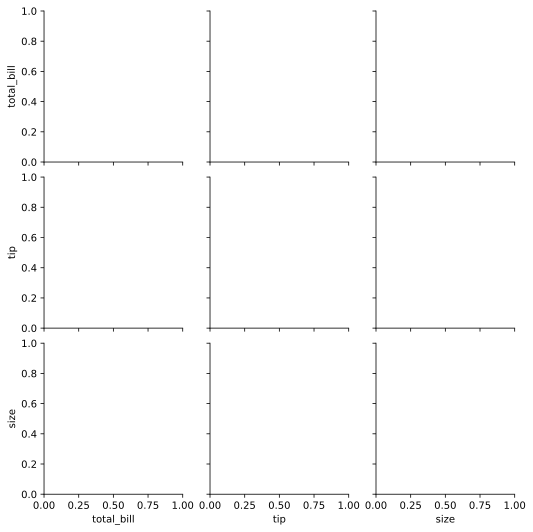

In [47]:
g = sns.PairGrid(tips)

Начнем заполнять этот шаблон. Например, по диагонали расположим скрипичные графики:

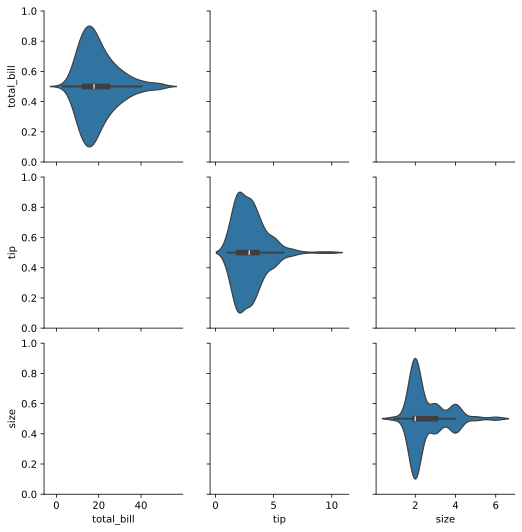

In [48]:
g = sns.PairGrid(tips)
g.map_diag(sns.violinplot);

Далее в нижней треугольной матрице расположим диаграммы рассеяния:

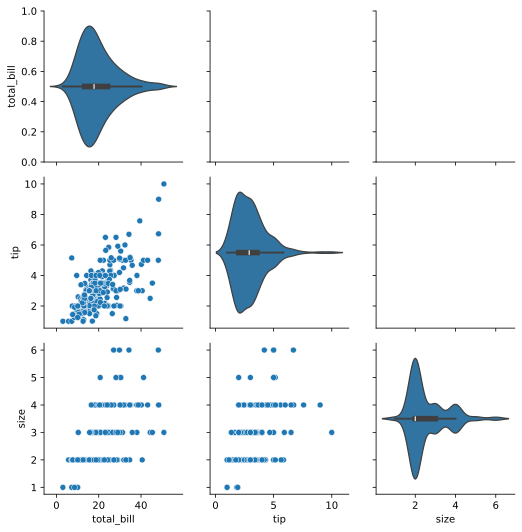

In [49]:
g = sns.PairGrid(tips)
g.map_diag(sns.violinplot)
g.map_lower(sns.scatterplot);

А в верхней треугольной матрице разместим графики kde:

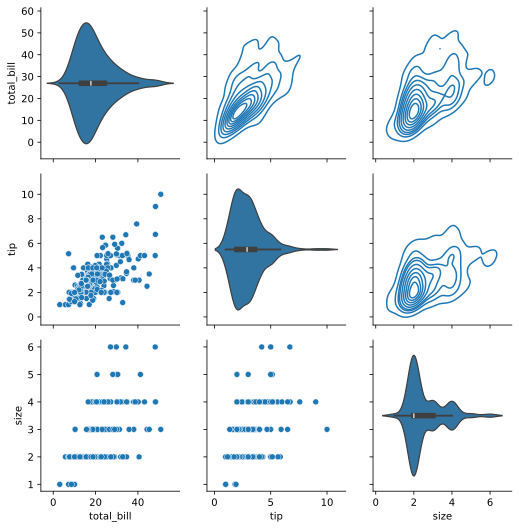

In [50]:
g = sns.PairGrid(tips)
g.map_diag(sns.violinplot)
g.map_lower(sns.scatterplot)
g.map_upper(sns.kdeplot);

Разобьём данные по времени посещения ресторана, используя параметр `hue` класса **PairGrid**:

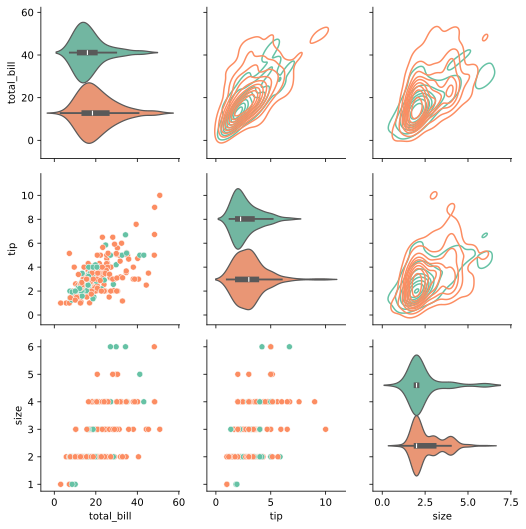

In [51]:
g = sns.PairGrid(tips, hue='time', palette='Set2')
g.map_diag(sns.violinplot)
g.map_lower(sns.scatterplot)
g.map_upper(sns.kdeplot);

Уменьшим количество уровней на диаграммах `kde` и добавим легенду методом `add_legend()`:

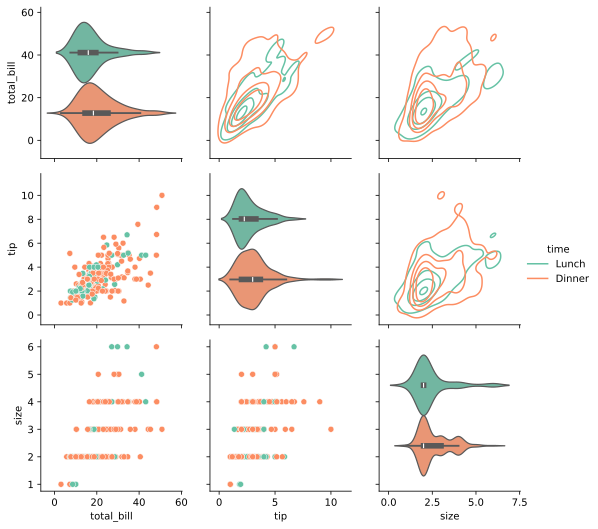

In [52]:
g = sns.PairGrid(tips, hue='time', palette='Set2')
g.map_diag(sns.violinplot)
g.map_lower(sns.scatterplot)
g.map_upper(sns.kdeplot,
            n_levels=5)
g.add_legend();

Через метод `fig()` применим функцию `suptitle()` библиотеки *matplotlib* для отображения общего заголовка:

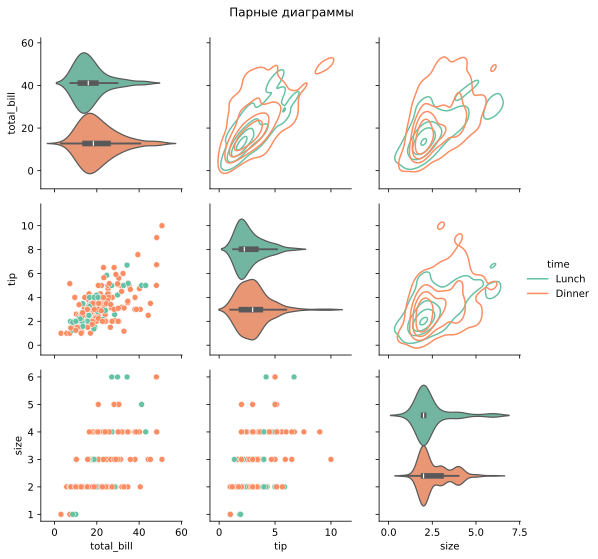

In [53]:
g = sns.PairGrid(tips, hue='time', palette='Set2')
g.map_diag(sns.violinplot)
g.map_lower(sns.scatterplot)
g.map_upper(sns.kdeplot,
            n_levels=5)
g.add_legend()
g.fig.suptitle('Парные диаграммы', y=1.03);

График с индивидуальными настройками готов!